# Object Detection with Google Gemini 3.5 Flash

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow/notebooks/blob/main/notebooks/object-detection-with-gemini-3-5-flash.ipynb)

This notebook demonstrates how to use Google Gemini 3.5 Flash for zero-shot object detection and parse the results with the [supervision](https://github.com/roboflow/supervision) library.

We cover:
- Building detection prompts for Gemini
- Single-prompt multi-class detection
- Per-class detection with merged results
- Structured output (forced JSON) for dense scenes

## Install required packages

In [ ]:
!pip install -q google-genai "supervision @ git+https://github.com/roboflow/supervision.git@add-gemini-3.5-vlm-support"

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 4.1 MB/s eta 0:00:00


## Configure API Key

You need a Gemini API key from [Google AI Studio](https://aistudio.google.com). Add it to your Colab secrets as `GOOGLE_API_KEY`.

In [ ]:
from google.colab import userdata
from google import genai

GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
client = genai.Client(api_key=GOOGLE_API_KEY)

## Download example images

In [ ]:
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/pexels-vanessa-loring-5966631.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/pexels-eyup-sayar-290427017-18373303.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/pexels-mutecevvil-18013812.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/pexels-shvets-production-7195054.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/pexels-spencer-4353558.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/top-shot-of-a-worker-scanning-boxes-using-a-bar-co-2026-01-11-09-59-09-utc.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/warehouse-workers-inspecting-boxes-along-conveyor-2026-01-11-09-55-23-utc.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/top-view-of-people-relaxing-in-the-pool-on-yellow-2026-03-24-21-54-59-utc.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/playground-examples/aerial-drone-photograph-of-traffic-jam-in-metropol-2026-03-18-17-36-02-utc.jpg

## Imports and Utilities

We define a prompt template that instructs Gemini to return bounding boxes in `[ymin, xmin, ymax, xmax]` format normalized to 0–1000, along with a reusable annotation function.

In [ ]:
from google.genai import types
from pydantic import BaseModel, Field
from PIL import Image
import supervision as sv


DETECTION_PROMPT_TEMPLATE = """
Carefully examine this image and detect ALL visible objects, including small, distant, or partially visible ones.
IMPORTANT: Focus on finding as many objects as possible, even if you are only moderately confident.
Make sure each bounding box is as tight as possible.
Valid object classes: {class_list}
For each detected object, provide:
- "label": the exact class name from the list above
- "confidence": your certainty (between 0.0 and 1.0)
- "box_2d": the bounding box [ymin, xmin, ymax, xmax] normalized to 0-1000
Detect everything that matches the valid classes. Do not be conservative; include objects even with moderate confidence.
Return a JSON array, for example:
[
    {{"label": "{class_example}", "confidence": 0.95, "box_2d": [100, 200, 300, 400]}}
]
"""

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])


class Detection(BaseModel):
    label: str
    confidence: float = Field(ge=0, le=1)
    box_2d: list[int] = Field(min_length=4, max_length=4)


def build_detection_prompt(classes: list[str]) -> str:
    return DETECTION_PROMPT_TEMPLATE.format(
        class_list=", ".join(classes),
        class_example=classes[0],
    ).strip()


def annotate_image(image, detections, with_labels=True):
    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    annotated = image.copy()
    annotated = sv.BoxAnnotator(
        color=COLOR, thickness=thickness
    ).annotate(annotated, detections)

    if with_labels:
        annotated = sv.LabelAnnotator(
            color=COLOR,
            text_color=sv.Color.BLACK,
            text_scale=text_scale,
            text_thickness=thickness,
            smart_position=True,
        ).annotate(annotated, detections)

    annotated.thumbnail((1000, 1000))
    return annotated

## Example: Avocado Detection (Single Prompt)

Detect all avocado-related classes in a single API call.

In [ ]:
IMAGE_PATH = "pexels-vanessa-loring-5966631.jpg"
CLASSES = ["avocado with the pit", "avocado without the pit", "pit"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)
print(response.text)

```json
[
  {"label": "avocado with the pit", "confidence": 0.99, "box_2d": [75, 62, 283, 239]},
  {"label": "avocado with the pit", "confidence": 0.99, "box_2d": [57, 678, 273, 810]},
  {"label": "avocado with the pit", "confidence": 0.99, "box_2d": [338, 801, 564, 953]},
  {"label": "avocado with the pit", "confidence": 0.99, "box_2d": [526, 169, 731, 325]},
  {"label": "avocado with the pit", "confidence": 0.99, "box_2d": [728, 402, 948, 565]},
  {"label": "avocado without the pit", "confidence": 0.99, "box_2d": [121, 359, 316, 538]},
  {"label": "avocado without the pit", "confidence": 0.99, "box_2d": [388, 507, 616, 638]},
  {"label": "avocado without the pit", "confidence": 0.99, "box_2d": [667, 32, 936, 153]},
  {"label": "avocado without the pit", "confidence": 0.99, "box_2d": [757, 720, 977, 882]},
  {"label": "pit", "confidence": 0.99, "box_2d": [121, 104, 232, 175]},
  {"label": "pit", "confidence": 0.99, "box_2d": [91, 704, 213, 782]},
  {"label": "pit", "confidence": 0.99,

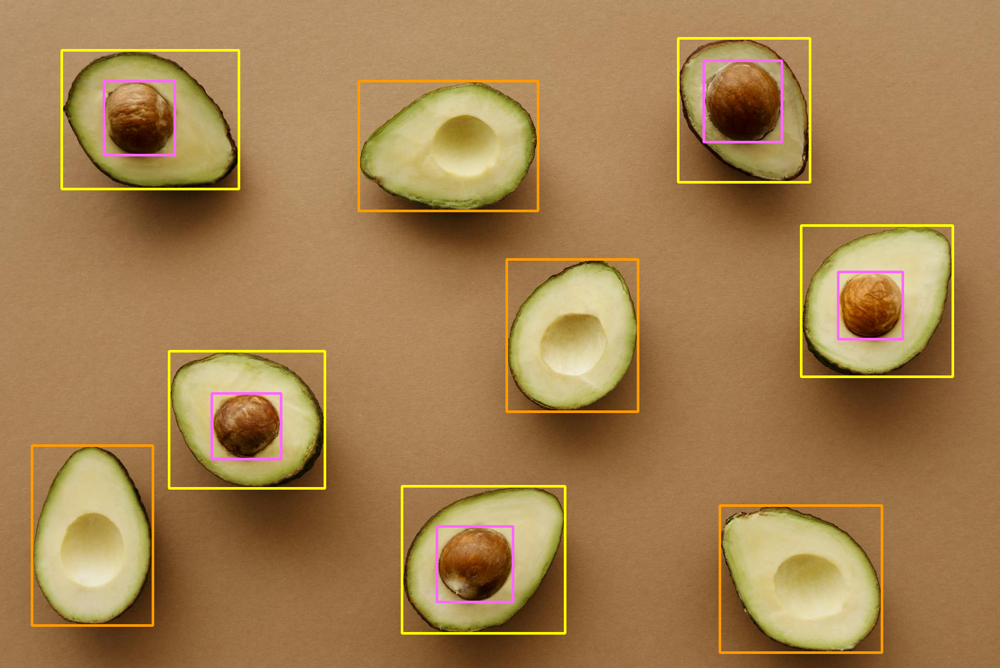

In [ ]:
detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=False)

## Example: Air Balloons

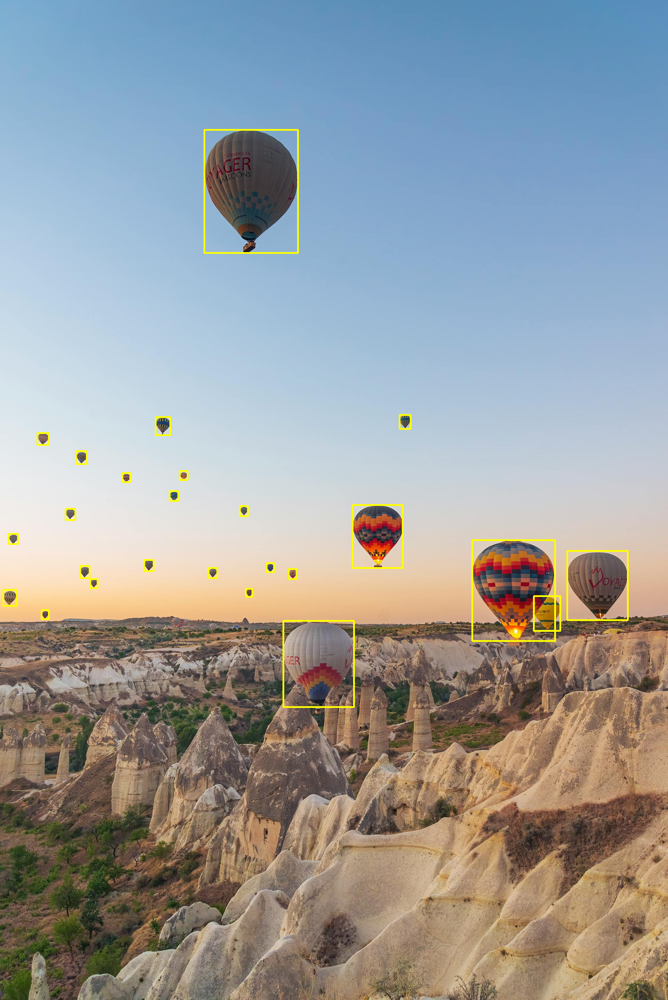

In [ ]:
IMAGE_PATH = "pexels-eyup-sayar-290427017-18373303.jpg"
CLASSES = ["air balloon"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=False)

## Example: Birds

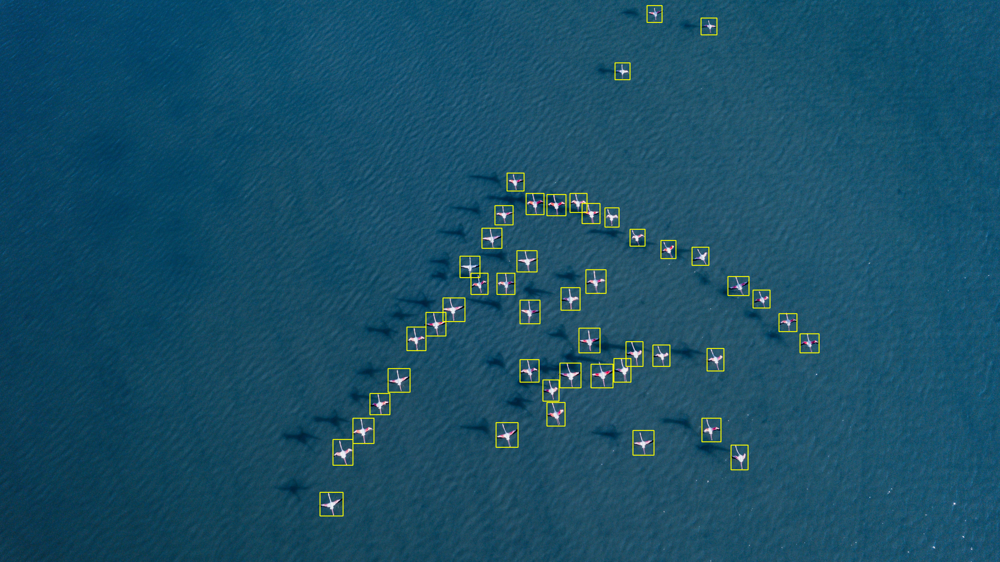

In [ ]:
IMAGE_PATH = "pexels-mutecevvil-18013812.jpg"
CLASSES = ["bird"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=False)

## Example: Bananas

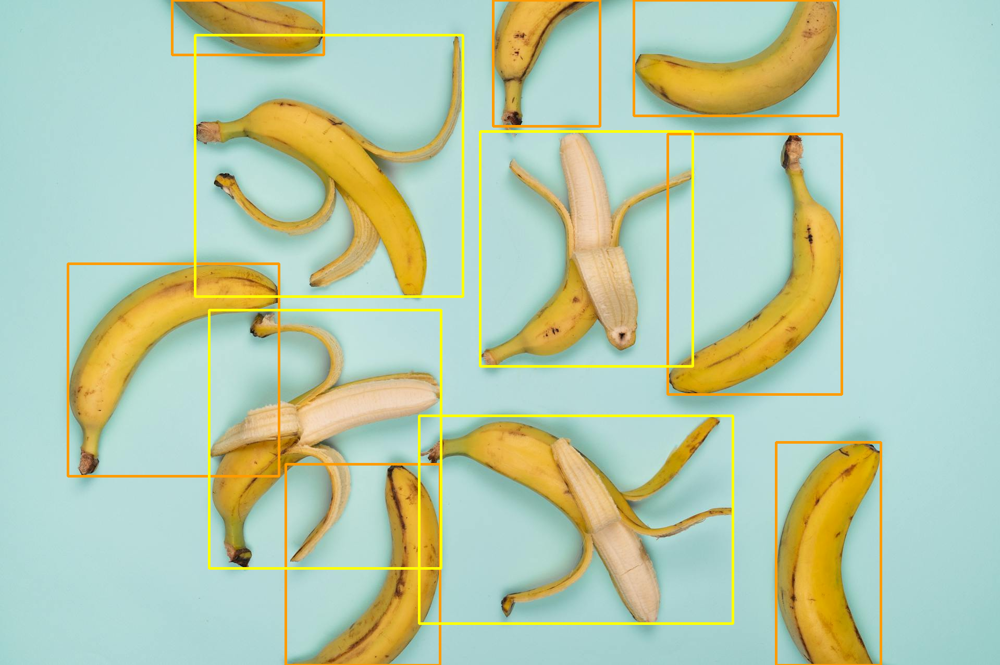

In [ ]:
IMAGE_PATH = "pexels-shvets-production-7195054.jpg"
CLASSES = ["open banana", "closed banana"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=False)

## Example: Cars and Lanes

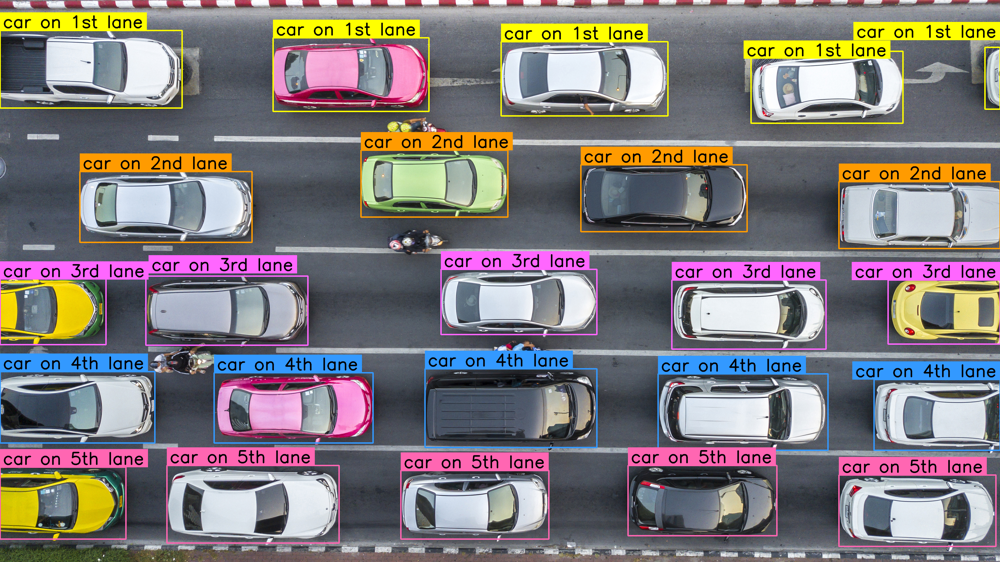

In [ ]:
IMAGE_PATH = "aerial-drone-photograph-of-traffic-jam-in-metropol-2026-03-18-17-36-02-utc.jpg"
CLASSES = ["car on 1st lane", "car on 2nd lane", "car on 3rd lane", "car on 4th lane", "car on 5th lane", "car on 6th lane"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=True)

## Example: Sealed Packages

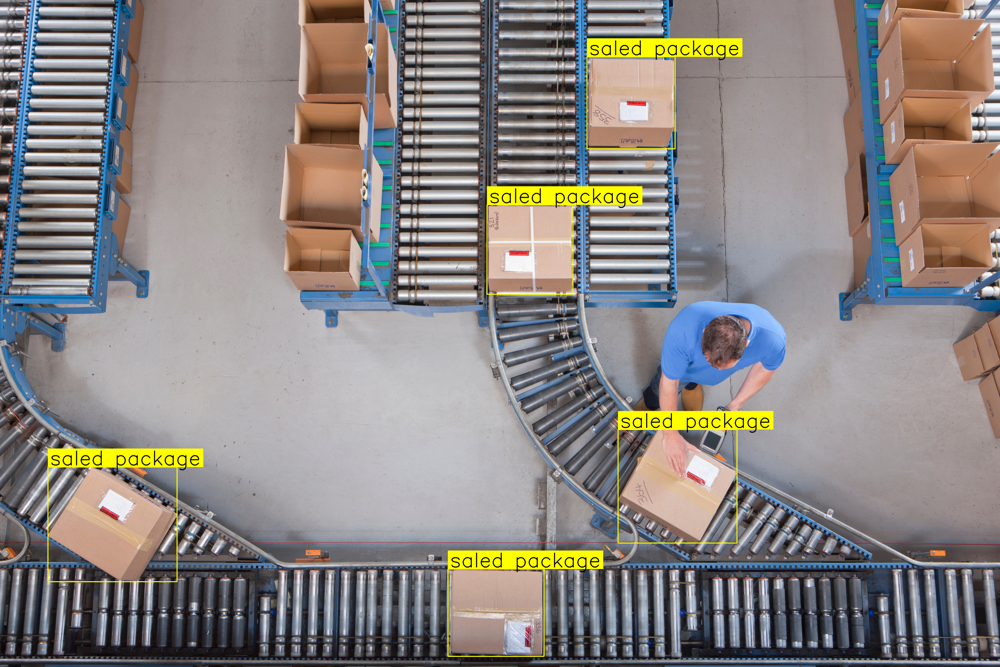

In [ ]:
IMAGE_PATH = "top-shot-of-a-worker-scanning-boxes-using-a-bar-co-2026-01-11-09-59-09-utc.jpg"
CLASSES = ["saled package"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=True)

## Example: Package Labels

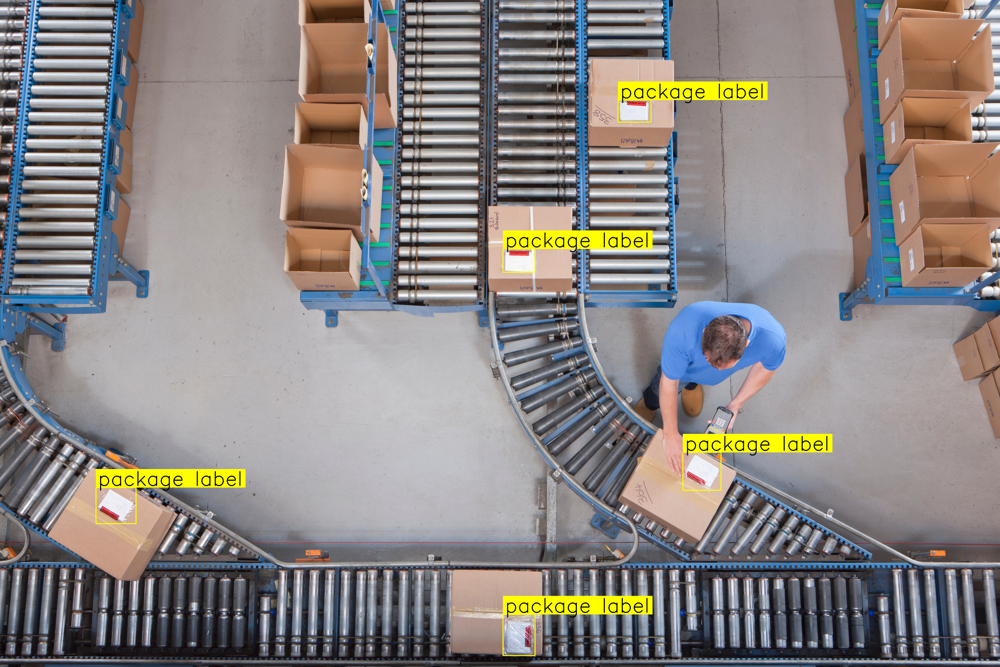

In [ ]:
IMAGE_PATH = "top-shot-of-a-worker-scanning-boxes-using-a-bar-co-2026-01-11-09-59-09-utc.jpg"
CLASSES = ["package label"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=True)

## Example: Conveyor Packages

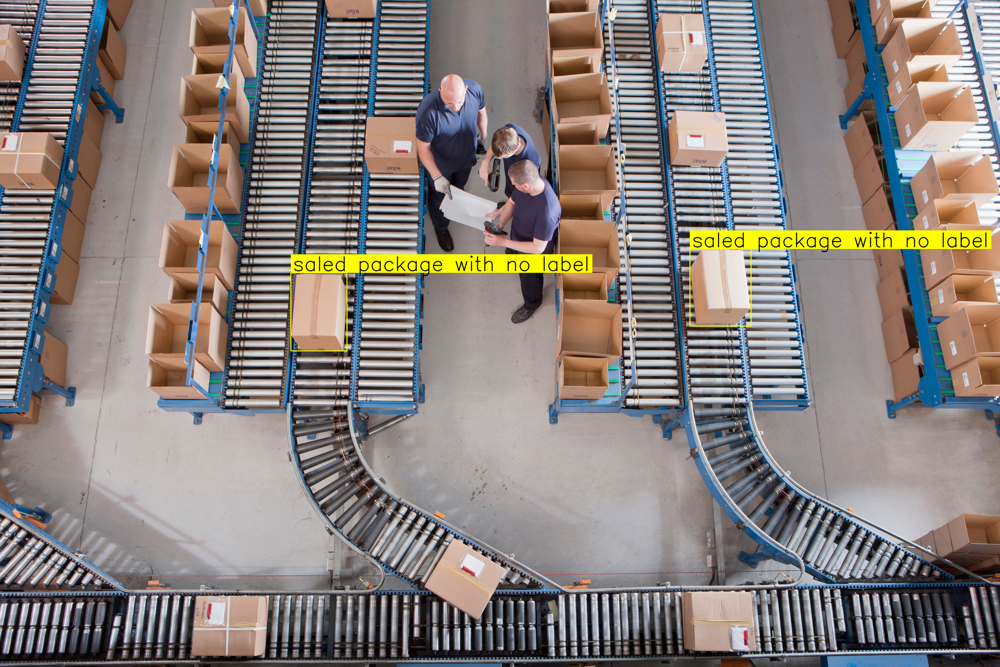

In [ ]:
IMAGE_PATH = "warehouse-workers-inspecting-boxes-along-conveyor-2026-01-11-09-55-23-utc.jpg"
CLASSES = ["saled package with no label"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=True)

## Example: Yellow Swim Rings (Free-form Response)

In dense scenes with many objects, the model may truncate its response before completing the JSON array. Here we use the standard prompt without forcing the output format.

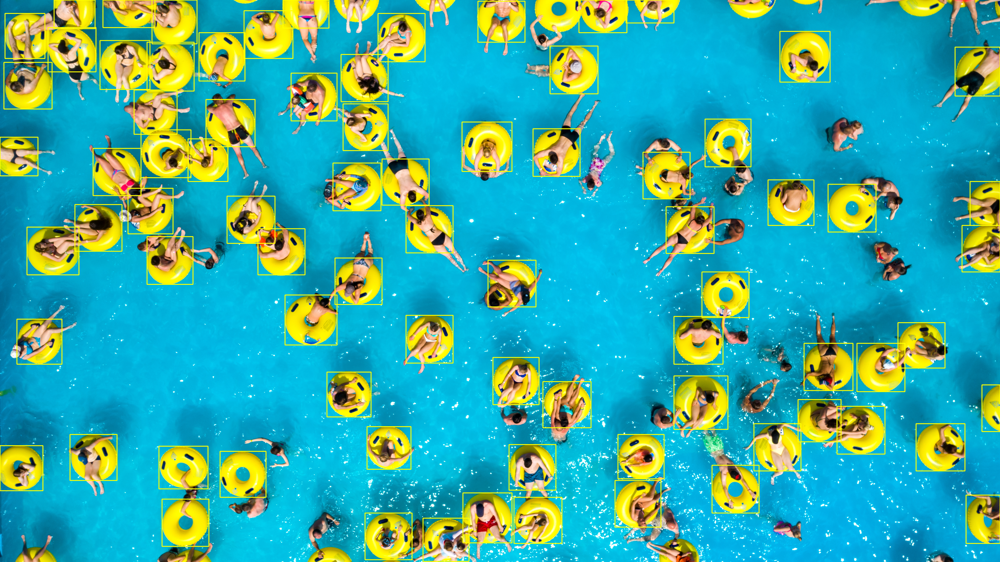

In [ ]:
IMAGE_PATH = "top-view-of-people-relaxing-in-the-pool-on-yellow-2026-03-24-21-54-59-utc.jpg"
CLASSES = ["yellow swim ring"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=False)

## Example: Person (Structured Output)

Using `response_mime_type="application/json"` with a `response_schema` forces Gemini to return valid JSON conforming to our schema. This is especially useful for dense scenes where free-form responses might truncate mid-JSON.

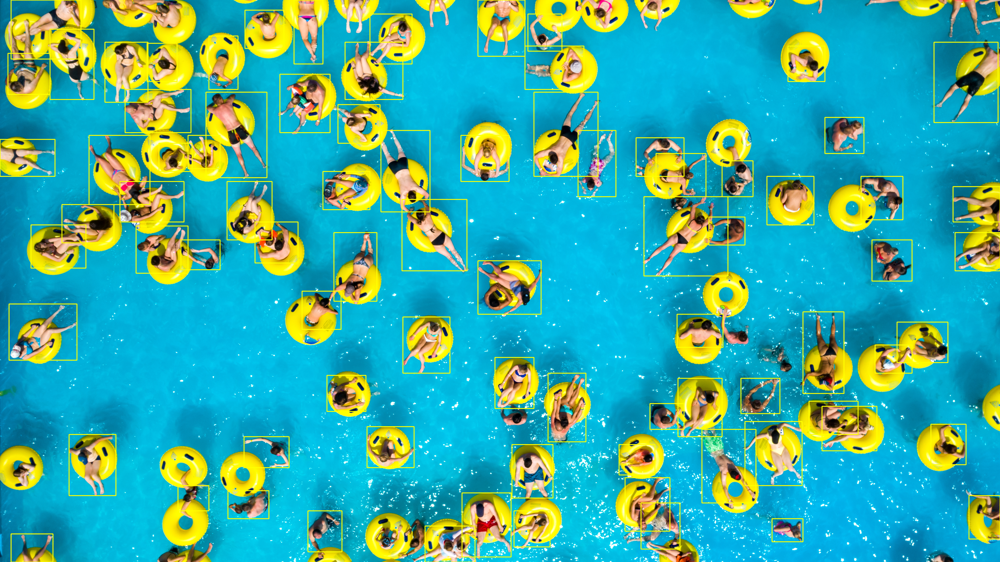

In [ ]:
IMAGE_PATH = "top-view-of-people-relaxing-in-the-pool-on-yellow-2026-03-24-21-54-59-utc.jpg"
CLASSES = ["person"]

image = Image.open(IMAGE_PATH)
prompt = build_detection_prompt(CLASSES)

response = client.models.generate_content(
    model="gemini-3.5-flash",
    contents=[image, prompt],
    config=types.GenerateContentConfig(
        response_mime_type="application/json",
        response_schema=list[Detection],
        temperature=0,
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.GOOGLE_GEMINI_3_5,
    result=response.text,
    resolution_wh=image.size,
    classes=CLASSES,
)

annotate_image(image, detections, with_labels=False)